# **IMPORT**

In [23]:
import face_recognition
from PIL import Image, ImageDraw
from IPython.display import display  
import numpy as np

from pathlib import Path
import cv2
import os
import json

from scenedetect import detect, AdaptiveDetector, split_video_ffmpeg

# **DETECTION FUNCTIONS**

In [33]:
def display_resize_image(pil_image, size=3):
    primary_dimention = pil_image.size.index(max(pil_image.size))
    secondary_dimention = int(1 - primary_dimention)

    primary_size = size * 100
    ratio = primary_size / float(pil_image.size[primary_dimention])
    secondary_size = int(float(pil_image.size[secondary_dimention]) * ratio)

    width = primary_size if primary_dimention == 0 else secondary_size
    height = secondary_size if primary_dimention == 0 else primary_size
    resized_image = pil_image.resize((width, height), Image.Resampling.LANCZOS)
    display(resized_image)

def get_bbox(locations):
    bbox = []
    for location in locations:
        top, right, bottom, left = location
        x = left
        y = top
        width = right - left
        height = bottom - top
        face_coords = [x, y, width, height]
        bbox.append(face_coords)

    return bbox

def get_bbox_area(face_location):
    top, right, bottom, left = face_location
    width = right - left
    height = bottom - top
    area = width * height
    return area

def get_marked_pil(frame_rgb, results, locations):
    pil_marked = Image.fromarray(frame_rgb)
    draw = ImageDraw.Draw(pil_marked)
    for res, location in zip(results, locations):
        top, right, bottom, left = location
        color = "red" if res else "black"
        draw.rectangle(
            ((left, top), (right, bottom)),
            outline=color,
            width=20
        )
    return pil_marked

def sort_locations_with_desc_area(area_locations_list): # area_locations format: (area, locations)
    sorted_area_locations = sorted(area_locations_list, key=lambda x: x[0], reverse=True)
    sorted_locations = [area_locations[1] for area_locations in sorted_area_locations]
    return sorted_locations

def convert_relative_path_to_absolute(path): # relative path can be either file or folder
    return f'project/{str(Path(path).resolve()).split("project/")[-1]}'


def visualize_detect_result(face_encodings, target_encoding, results, locations, position_name, frame_rgb, found):
    num_detected_faces = len(np.where(results)[0])
    if found:
        message = f"found target face"
        emoji = "✅"
    else:
        message = "no match target face, but found other faces"
        emoji = "❌"
    
    distances = face_recognition.face_distance(face_encodings, target_encoding)
    print(f"> {emoji} Checked {position_name} frame ({message}, {num_detected_faces}/{len(face_encodings)})")
    print("distances:")
    for distance in sorted(distances):
        print(f'- {distance}')

    pil_marked = get_marked_pil(frame_rgb, results, locations)
    display_resize_image(pil_marked, size=3)
        
def get_visible_face_locations(face_locations, image_area, desc_sorted_by_area=True):
    locations_list = []

    for face_location in face_locations:
        bbox_area = get_bbox_area(face_location)
        ratio = (bbox_area / image_area) * 100
        if ratio > 1:
            if desc_sorted_by_area:
                locations_list.append((bbox_area, face_location))
            else:
                locations_list.append(face_location)

        return sort_locations_with_desc_area(locations_list) if desc_sorted_by_area else locations_list  

def get_sorted_face_locations(face_locations):
    area_locations_list = []
    for face_location in face_locations:
        bbox_area = get_bbox_area(face_location)
        area_locations_list.append((bbox_area, face_location))

    sorted_locations = sort_locations_with_desc_area(area_locations_list)
    return sorted_locations

def find_face_locations(image_path, only_visible=False, show_progress=False, border_color="blue", desc_sorted_by_area = False, show_image_size=3):
    final_face_locations = None

    pil_image = Image.open(image_path)
    faces = face_recognition.load_image_file(image_path)
    face_locations = face_recognition.face_locations(faces)

    if len(face_locations) == 0:
        print("no face detected")
        return None
    
    if only_visible:
        image_area = pil_image.size[0] * pil_image.size[1]
        final_face_locations = get_visible_face_locations(face_locations, image_area, desc_sorted_by_area)
        if show_progress:
            print(f"detected {len(final_face_locations)}/{len(face_locations)} VISIBLE faces.")
    else:
        final_face_locations = get_sorted_face_locations(face_locations) if desc_sorted_by_area else face_locations
        if show_progress:
            print(f"detected {len(final_face_locations)} faces")

    if show_progress:
        draw = ImageDraw.Draw(pil_image)
        for i, location in enumerate(final_face_locations):
            top, right, bottom, left = location
            if desc_sorted_by_area:
                color = "red" if i == 0 else border_color
            else:
                color = border_color
            draw.rectangle(
                ((left, top), (right, bottom)),
                outline=color,
                width=20
            )

        display_resize_image(pil_image, size=show_image_size)

    return final_face_locations

def encode_target_face(image_path, only_visible=True):
    target_face = face_recognition.load_image_file(image_path)
    sorted_target_face_locations = find_face_locations(
        image_path, 
        only_visible, 
        show_progress=True, 
        border_color="black",
        desc_sorted_by_area=True,
    )

    if sorted_target_face_locations is None:
        display_resize_image(Image.open(image_path), size=2)
        raise Exception(f"No face detected, ensure to have human face in your reference image {image_path}")
    
    face_location_with_largest_area = sorted_target_face_locations[0]
    target_encoding = face_recognition.face_encodings(target_face, [face_location_with_largest_area])[0]
    return target_encoding
    
def detect_and_match_faces(frame, target_encoding, tolerance):
    # Detect all faces in frame
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) 
    locations = face_recognition.face_locations(frame_rgb)
    if len(locations) == 0: # no face
        return None
    
    # Get face encodings
    face_encodings = face_recognition.face_encodings(frame_rgb, locations)

    # Compare with target face
    results = face_recognition.compare_faces(face_encodings, target_encoding, tolerance)
    detected_face_indices = np.where(results)[0]
    num_detected_faces = len(detected_face_indices)
    if num_detected_faces == 0: # has face, but no match
        return None
    
    # Get bbox for all detected target faces
    detected_face_locations = [locations[i] for i in detected_face_indices]
    bbox = get_bbox(detected_face_locations)

    # Mark all faces
    pil_marked = get_marked_pil(frame_rgb, results, locations)
    marked_frame = cv2.cvtColor(np.array(pil_marked), cv2.COLOR_RGB2BGR) # Convert PIL image back to BGR for video writing
    
    # Return coordinates of matched face
    return num_detected_faces, bbox, marked_frame

def save_metadata(metadata, file_path):
    with open(file_path, "w") as f:
        json.dump(metadata, f, indent=2)
    print(f"saved metadata to {convert_relative_path_to_absolute(file_path)}")


class FaceDetector:

    def __init__(self, video_name_with_extension, reference_image_name_with_extension, tolerance):
        self.VIDEO_PATH = f"../source/{video_name_with_extension}"
        self.IMAGE_PATH = f"../source/{reference_image_name_with_extension}"
        
        self.VIDEO_NAME = video_name_with_extension
        self.VIDEO_NAME_ONLY = os.path.splitext(video_name_with_extension)[0]
        
        self.IMAGE_NAME = reference_image_name_with_extension
        self.IMAGE_NAME_ONLY = os.path.splitext(reference_image_name_with_extension)[0]

        self.TOLERANCE = tolerance

        self.NUM_SCENES = None
        self.FPS = None
        self.WIDTH = None
        self.HEIGHT = None

        self.TARGET_ENCODING = None

        self.METADATA = None

        self.SCENES_INFO_START_END_TIME = []

        self.FULL_CLIP = None
        self.FULL_CLIP_MARKED = None

        self.FOUND_MATCHED = False

    def run(self, show_process=False):
        print("\n-------- Encoding Target Face --------")
        self.TARGET_ENCODING = encode_target_face(self.IMAGE_PATH, only_visible=True)
        self.access_video()
        self.create_folders()
        self.initiate_metadata()
        print("\n-------- Splitting Video Into Scenes --------")
        scene_list = self.split_video_into_scenes()
        self.cut_video_into_scenes(scene_list)
        self.ready_full_clips()
        print("\n-------- Processing Scenes --------")
        self.process_scenes(show_process)
        print("\n-------- Saving Metadata --------")
        save_metadata(self.METADATA, self.METADATA_PATH)
        self.finalize_full_clips()

    def create_folders(self): # if not exist yet
        results_dir = f"../results/{self.IMAGE_NAME_ONLY}_{self.VIDEO_NAME_ONLY}"
        self.DITECT_SCENES_DIR = f"{results_dir}/detect_scenes"
        cropped_videos_dir = f"{results_dir}/cropped_videos"
        self.NORMAL_CLIPS_DIR = f"{cropped_videos_dir}/normal"
        self.MARKED_CLIPS_DIR = f"{cropped_videos_dir}/marked"

        self.FULL_CLIP_PATH = f"{results_dir}/full_clip.mp4"
        self.FULL_CLIP_MARKED_PATH = f"{results_dir}/full_clip_marked.mp4"

        self.METADATA_PATH = f"{results_dir}/metadata.json"

        folders = [
            self.DITECT_SCENES_DIR, 
            self.NORMAL_CLIPS_DIR, 
            self.MARKED_CLIPS_DIR
        ]
        for dir in folders:
            os.makedirs(dir, exist_ok=True)

    def access_video(self):
        cap = cv2.VideoCapture(self.VIDEO_PATH)
        if not cap.isOpened():
            raise Exception(f"Could not open video file {self.VIDEO_PATH}")
            
        # Get video properties
        self.FPS = cap.get(cv2.CAP_PROP_FPS)
        self.WIDTH = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        self.HEIGHT = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        cap.release()
    
    def initiate_metadata(self):
        self.METADATA = {
            "clips": [],
            "video_properties": {
                "fps": self.FPS,
                "width": self.WIDTH,
                "height": self.HEIGHT
            }
        }

    def split_video_into_scenes(self):
        scene_list = detect(self.VIDEO_PATH, AdaptiveDetector())
        self.NUM_SCENES = len(scene_list)
        if self.NUM_SCENES == 0:
            raise Exception(f"Progress stopped, because no scene can be split from video {self.VIDEO_NAME}")
        
        self.FPS = scene_list[0][0].framerate

        for i in range(self.NUM_SCENES):
            scene = scene_list[i]
            start_timecode = str(scene[0]) # Format: HH:MM:SS.nnn
            end_timecode = str(scene[1])  
            self.SCENES_INFO_START_END_TIME.append([start_timecode, end_timecode])

        print(f"detected {self.NUM_SCENES} scenes from video {self.VIDEO_NAME_ONLY},")
        return scene_list
    
    def cut_video_into_scenes(self, scene_list):
        def custom_scene_formatter(scene, video):
            return f"scene_{scene.index + 1}.mp4" # Format: scene_1.mp4

        split_video_ffmpeg(
            self.VIDEO_PATH,
            scene_list,
            output_dir=self.DITECT_SCENES_DIR,
            formatter=custom_scene_formatter,
            show_progress=True
        )

        print(f"saved in {convert_relative_path_to_absolute(self.DITECT_SCENES_DIR)}")

    def ready_full_clips(self):
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        self.FULL_CLIP = cv2.VideoWriter(self.FULL_CLIP_PATH, fourcc, self.FPS, (self.WIDTH, self.HEIGHT))
        self.FULL_CLIP_MARKED = cv2.VideoWriter(self.FULL_CLIP_MARKED_PATH, fourcc, self.FPS, (self.WIDTH, self.HEIGHT))
    
    def finalize_full_clips(self):
        self.FULL_CLIP.release()
        self.FULL_CLIP_MARKED.release()

        if not self.FOUND_MATCHED:
            os.remove(self.FULL_CLIP_PATH)
            os.remove(self.FULL_CLIP_MARKED_PATH)
            print(f"Not found any target face at all throughout the entire video {convert_relative_path_to_absolute(self.VIDEO_PATH)}")
        else:
            print(f"Full clip saved to: {convert_relative_path_to_absolute(self.FULL_CLIP_PATH)}")
            print(f"Marked full clip saved to: {convert_relative_path_to_absolute(self.FULL_CLIP_MARKED_PATH)}")
            

    def process_scenes(self, show_process=False):
        for i in range(self.NUM_SCENES):
            scene_id = i + 1
            clip_info = self.process_scene(scene_id, show_process)
            if clip_info is not None:
                self.METADATA["clips"].append(clip_info)
                if not self.FOUND_MATCHED:
                    self.FOUND_MATCHED = True
            
            if not show_process:
                message = "✅ target face detected" if clip_info is not None else "❌ no match"
                print(f"processed scene {scene_id}: {message}")
        
        print("finished processing all scenes.")

    def process_scene(self, scene_id, show_process=False):
        scene_path = f'{self.DITECT_SCENES_DIR}/scene_{scene_id}.mp4'
        scene_cap = cv2.VideoCapture(scene_path)

        if not scene_cap.isOpened():
            print(f"Could not open scene video {scene_path}, skip it.")
            return None

        total_frames = int(scene_cap.get(cv2.CAP_PROP_FRAME_COUNT))

        if show_process:
            print(f'\n**** Processing Scene: {scene_id} ****')

        # Check if scene samples has target face
        matched_face = self.check_scene(scene_cap, total_frames, show_process)
        if not matched_face:
            if show_process:
                print("no need to further detect all frames")
            return None
        
        # Get to process all frames
        if show_process:
            print(f'> now processing all frames')
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # or 'XVID'
        clip_path = f"{self.NORMAL_CLIPS_DIR}/scene_{scene_id}.mp4"
        clip = cv2.VideoWriter(clip_path, fourcc, self.FPS, (self.WIDTH, self.HEIGHT))
        
        marked_clip_path = f"{self.MARKED_CLIPS_DIR}/scene_{scene_id}.mp4"
        marked_clip = cv2.VideoWriter(marked_clip_path, fourcc, self.FPS, (self.WIDTH, self.HEIGHT))

        clip, marked_clip, clip_info_target_face_coordinates = self.process_all_frames(scene_cap, total_frames, clip, marked_clip, show_process)
        
        # Release video writer
        clip.release()
        marked_clip.release()

        if show_process:
            print(f"> Clip saved to: {convert_relative_path_to_absolute(clip_path)}")
            print(f"> Marked clip saved to: {convert_relative_path_to_absolute(marked_clip_path)}")
        
        start_timecode, end_timecode = self.SCENES_INFO_START_END_TIME[scene_id - 1]
        clip_info = {
            "file_name": f"scene_{scene_id}.mp4",
            "start_timecode": start_timecode,
            "end_timecode": end_timecode,
            "target_face_coordinates": clip_info_target_face_coordinates
        }
        return clip_info
    
    def check_scene(self, scene_cap, total_frames, show_process=False):
        """
        Check first, middle and last frames from a scene video for target face
        """

        # Define frame positions to check
        positions = {
            'first': 0,
            'middle': total_frames // 2,
            'last': total_frames - 1
        }

        for position_name, frame_idx in positions.items():
            # Set frame position
            scene_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = scene_cap.read()
            
            if ret:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) # Convert frame to RGB and to PIL Image
                locations = face_recognition.face_locations(frame_rgb)
                if len(locations) == 0: # no face
                    if show_process:
                        print(f"> 🫥 No face in {position_name} frame")
                    continue
                face_encodings = face_recognition.face_encodings(frame_rgb, locations)
                results = face_recognition.compare_faces(face_encodings, self.TARGET_ENCODING, self.TOLERANCE)
                if len(np.where(results)[0]) == 0: # has faces, but no match
                    if show_process:
                        visualize_detect_result(face_encodings, self.TARGET_ENCODING, results, locations, position_name, frame_rgb, found=False)
                    continue
                else:
                    if show_process:
                        visualize_detect_result(face_encodings, self.TARGET_ENCODING, results, locations, position_name, frame_rgb, found=True)
                    return True

        return False
    
    def process_all_frames(self, scene_cap, total_frames, clip, marked_clip, show_process=False):
        clip_info_target_face_coordinates = []
        frame_number = 0
        
        # Reset video capture to beginning
        scene_cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

        while True:
            ret, frame = scene_cap.read()
            if not ret:
                break
            
            frame_number += 1
            results = detect_and_match_faces(frame, self.TARGET_ENCODING, self.TOLERANCE)
            if results is None: # this frame no detect target face, go to next frame
                continue
            
            num_detected_faces, bbox, marked_frame = results
            clip_info_target_face_coordinates.append(
                {
                    "frame_id": frame_number,
                    "num_detected_faces": num_detected_faces,
                    "bbox": bbox
                }
            )

            clip.write(frame)
            marked_clip.write(marked_frame)

            self.FULL_CLIP.write(frame)
            self.FULL_CLIP_MARKED.write(marked_frame)


            if show_process:
                if frame_number % 10 == 0:  # Print progress every 10 frames
                    print(f"> Checked frames: {frame_number}/{total_frames}")

        if show_process:
            print("> Done!")
            print(f"> Number of Clip frames VS Original Scene frames: {len(clip_info_target_face_coordinates)}/{total_frames}")
        
        return clip, marked_clip, clip_info_target_face_coordinates


def run_detect(reference_face_name, video_name, tolerance, show_process):
    face_detector = FaceDetector(
        video_name, 
        reference_face_name, 
        tolerance
    )
    face_detector.run(show_process)

# **RUN**

### **Scenario 1: Reference image has human face and target face can be found in video**

##### **1. reference_face.jpg + video.mp4**


-------- Encoding Target Face --------
detected 1/1 VISIBLE faces.


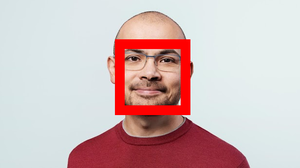


-------- Splitting Video Into Scenes --------
detected 73 scenes from video video,


100%|██████████| 3010/3010 [00:12<00:00, 238.42frame/s]


saved in project/results/reference_face_video/detect_scenes

-------- Processing Scenes --------
processed scene 1: ❌ no match
processed scene 2: ❌ no match
processed scene 3: ❌ no match
processed scene 4: ❌ no match
processed scene 5: ✅ target face detected
processed scene 6: ❌ no match
processed scene 7: ❌ no match
processed scene 8: ❌ no match
processed scene 9: ❌ no match
processed scene 10: ❌ no match
processed scene 11: ❌ no match
processed scene 12: ❌ no match
processed scene 13: ❌ no match
processed scene 14: ❌ no match
processed scene 15: ✅ target face detected
processed scene 16: ❌ no match
processed scene 17: ❌ no match
processed scene 18: ✅ target face detected
processed scene 19: ✅ target face detected
processed scene 20: ❌ no match
processed scene 21: ❌ no match
processed scene 22: ❌ no match
processed scene 23: ✅ target face detected
processed scene 24: ❌ no match
processed scene 25: ❌ no match
processed scene 26: ❌ no match
processed scene 27: ❌ no match
processed scene

In [34]:
run_detect(
    reference_face_name = "reference_face.jpg", 
    video_name = "video.mp4", 
    tolerance = 0.679, 
    show_process = False
)

##### **2. another_reference_face.jpg + another_video.mp4**


-------- Encoding Target Face --------
detected 1/1 VISIBLE faces.


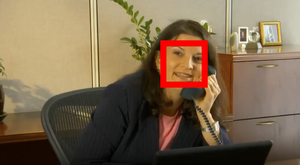


-------- Splitting Video Into Scenes --------
detected 37 scenes from video another_video,


100%|██████████| 3070/3070 [00:05<00:00, 578.26frame/s]


saved in project/results/another_reference_face_another_video/detect_scenes

-------- Processing Scenes --------

**** Processing Scene: 1 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9412124319040741


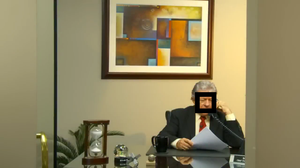

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9289465398453146


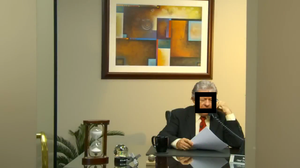

no need to further detect all frames

**** Processing Scene: 2 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.838692979908713


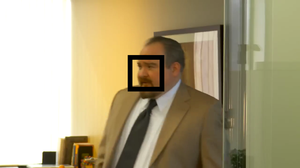

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8182089309973917


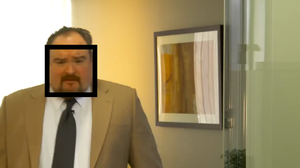

no need to further detect all frames

**** Processing Scene: 3 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.913350807959439


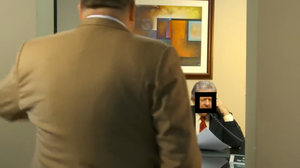

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8967337123070132


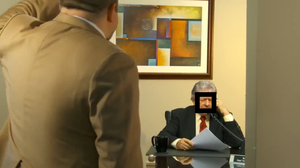

no need to further detect all frames

**** Processing Scene: 4 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9317938091755215


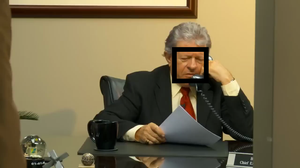

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.901902021577826


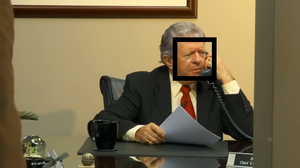

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8601888973919207


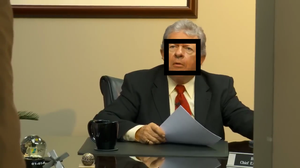

no need to further detect all frames

**** Processing Scene: 5 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.859400061418876


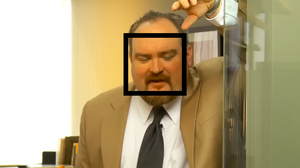

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8706998606786408


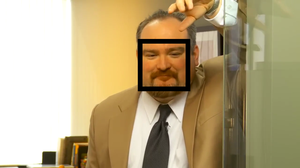

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8503145116213404


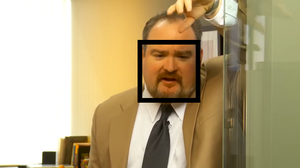

no need to further detect all frames

**** Processing Scene: 6 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9037212003178845


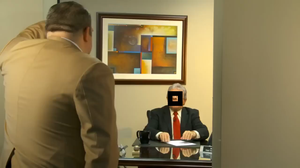

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9076369383807059


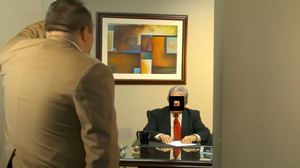

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9439426625510796


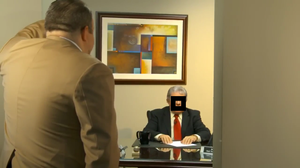

no need to further detect all frames

**** Processing Scene: 7 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8488599625921529


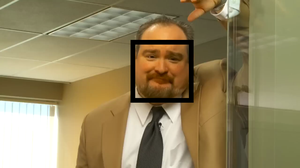

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8607766559159393


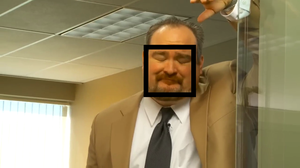

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8755002379066829


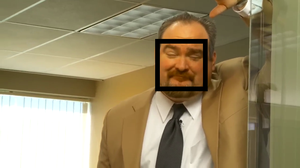

no need to further detect all frames

**** Processing Scene: 8 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9025073132676129


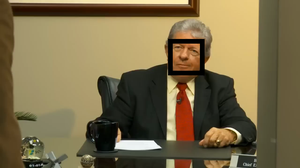

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8846183330749221


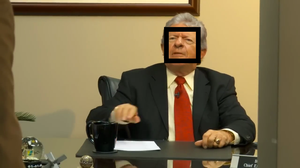

> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 9 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 10 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 11 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 12 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9042156248871871


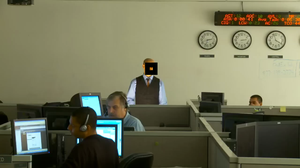

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9308232126177004


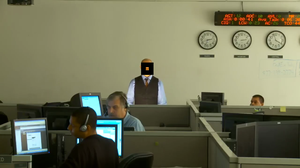

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8865278922405818


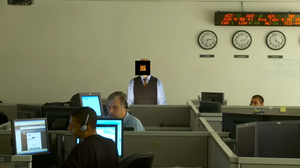

no need to further detect all frames

**** Processing Scene: 13 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 14 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 15 ****
> ✅ Checked first frame (found target face, 1/1)
distances:
- 0.31546840389521524


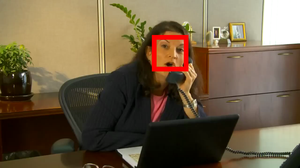

> now processing all frames
> Checked frames: 10/185
> Checked frames: 20/185
> Checked frames: 30/185
> Checked frames: 40/185
> Checked frames: 50/185
> Checked frames: 60/185
> Checked frames: 70/185
> Checked frames: 80/185
> Checked frames: 90/185
> Checked frames: 100/185
> Checked frames: 110/185
> Checked frames: 120/185
> Checked frames: 130/185
> Checked frames: 140/185
> Checked frames: 150/185
> Checked frames: 160/185
> Checked frames: 170/185
> Checked frames: 180/185
> Done!
> Number of Clip frames VS Original Scene frames: 185/185
> Clip saved to: project/results/another_reference_face_another_video/cropped_videos/normal/scene_15.mp4
> Marked clip saved to: project/results/another_reference_face_another_video/cropped_videos/marked/scene_15.mp4

**** Processing Scene: 16 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 17 ****
> ✅ Checked first frame (found target face, 1/1)

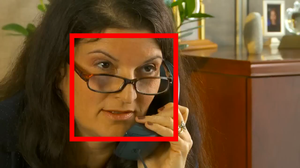

> now processing all frames
> Checked frames: 10/55
> Checked frames: 20/55
> Checked frames: 30/55
> Done!
> Number of Clip frames VS Original Scene frames: 36/55
> Clip saved to: project/results/another_reference_face_another_video/cropped_videos/normal/scene_17.mp4
> Marked clip saved to: project/results/another_reference_face_another_video/cropped_videos/marked/scene_17.mp4

**** Processing Scene: 18 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> ❌ Checked last frame (no match target face, but found other faces, 0/2)
distances:
- 0.7333106762978328
- 0.8797177827573505


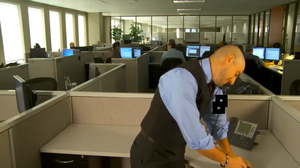

no need to further detect all frames

**** Processing Scene: 19 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 20 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 21 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.5514815993861147


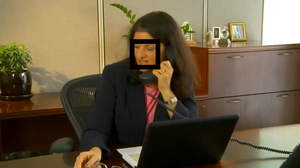

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.5069646204064134


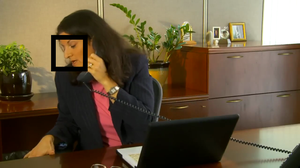

> ✅ Checked last frame (found target face, 1/1)
distances:
- 0.32523644669771706


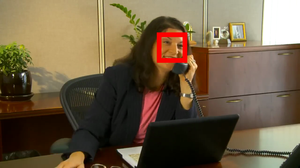

> now processing all frames
> Checked frames: 20/111
> Checked frames: 70/111
> Checked frames: 80/111
> Checked frames: 90/111
> Checked frames: 100/111
> Checked frames: 110/111
> Done!
> Number of Clip frames VS Original Scene frames: 61/111
> Clip saved to: project/results/another_reference_face_another_video/cropped_videos/normal/scene_21.mp4
> Marked clip saved to: project/results/another_reference_face_another_video/cropped_videos/marked/scene_21.mp4

**** Processing Scene: 22 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 23 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8944195066449099


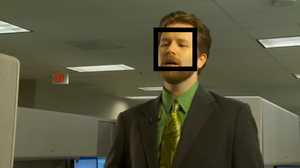

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9021428871574424


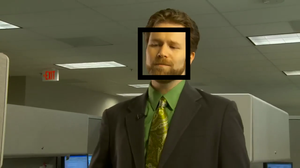

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8997465230215261


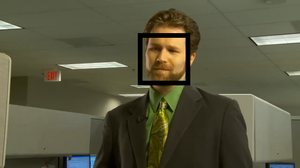

no need to further detect all frames

**** Processing Scene: 24 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8608990323482303


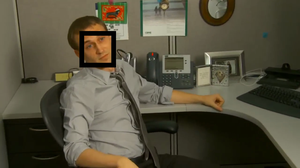

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9342439969852299


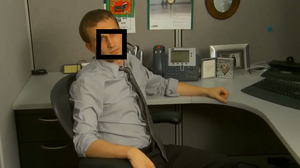

no need to further detect all frames

**** Processing Scene: 25 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8980139271777234


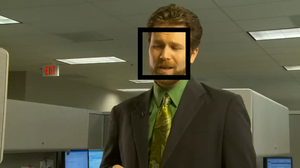

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8905336359763298


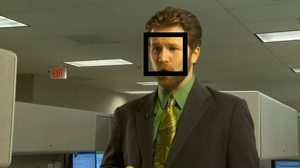

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9122297199084969


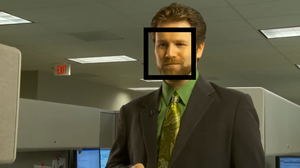

no need to further detect all frames

**** Processing Scene: 26 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9012090731904806


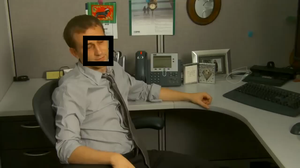

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8358035806737308


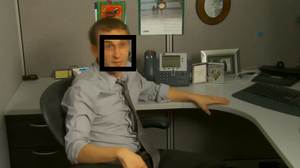

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8789278382624899


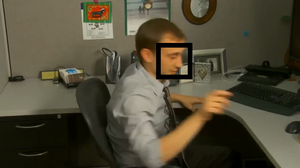

no need to further detect all frames

**** Processing Scene: 27 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9224645491574466


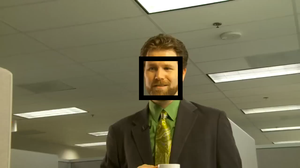

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.892898407267054


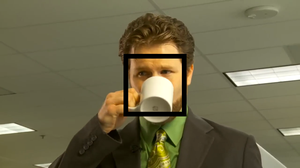

> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 28 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 29 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 30 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 31 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 32 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 33 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8651379578045214


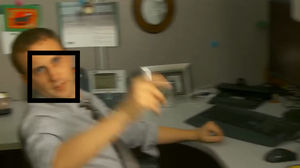

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8728527626817248


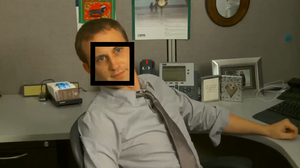

no need to further detect all frames

**** Processing Scene: 34 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9192760201970956


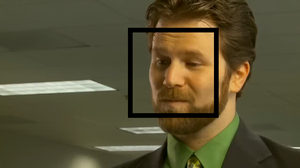

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9110535982794485


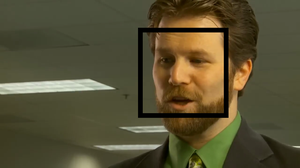

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9338514027479461


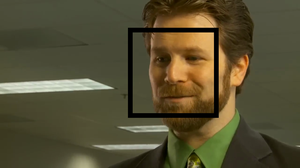

no need to further detect all frames

**** Processing Scene: 35 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8843742444533866


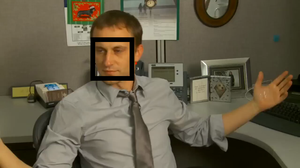

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8324375871891329


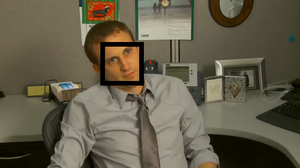

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.924079258433519


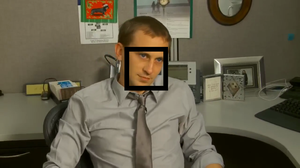

no need to further detect all frames

**** Processing Scene: 36 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.886029270412117


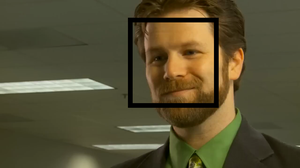

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9508211651873374


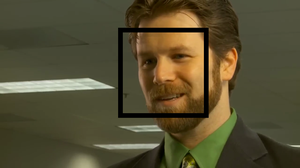

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9034026371235498


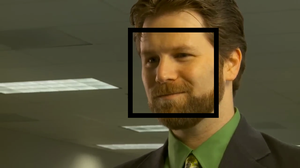

no need to further detect all frames

**** Processing Scene: 37 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames
finished processing all scenes.

-------- Saving Metadata --------
saved metadata to project/results/another_reference_face_another_video/metadata.json
Full clip saved to: project/results/another_reference_face_another_video/full_clip.mp4
Marked full clip saved to: project/results/another_reference_face_another_video/full_clip_marked.mp4


In [ ]:
run_detect(
    reference_face_name = "another_reference_face.png",
    video_name = "another_video.mp4", 
    tolerance = 0.5,
    show_process = True
)

### **Scenario 2: Reference image has human face but target face cannot be found in video**

##### **reference_face.jpg + another_video.mp4**


-------- Encoding Target Face --------
detected 1/1 VISIBLE faces.


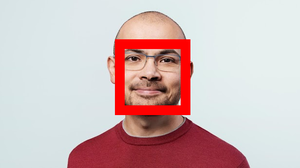


-------- Splitting Video Into Scenes --------
detected 37 scenes from video another_video,


100%|██████████| 3070/3070 [00:05<00:00, 604.89frame/s]


saved in project/results/reference_face_another_video/detect_scenes

-------- Processing Scenes --------

**** Processing Scene: 1 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8943337107945002


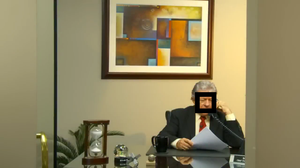

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8845126646624258


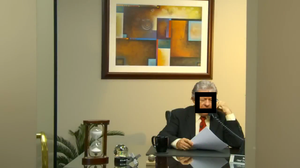

no need to further detect all frames

**** Processing Scene: 2 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.7052970089062373


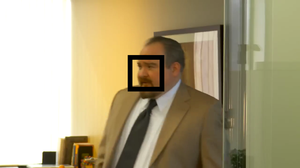

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.7677672991164582


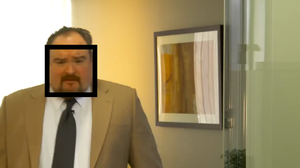

no need to further detect all frames

**** Processing Scene: 3 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8826247146426547


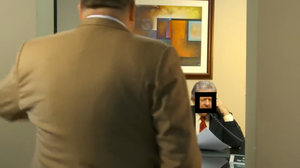

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8465800539908956


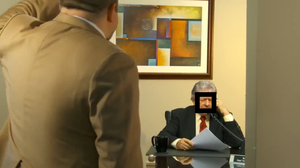

no need to further detect all frames

**** Processing Scene: 4 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8672020488353204


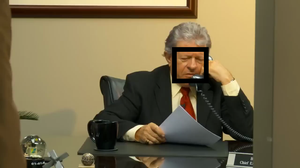

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.831884784321315


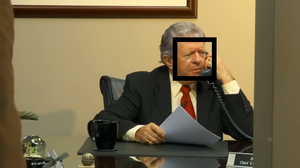

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8115688120732002


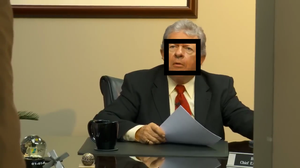

no need to further detect all frames

**** Processing Scene: 5 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.7809623393999964


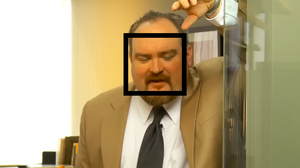

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.7699740839093154


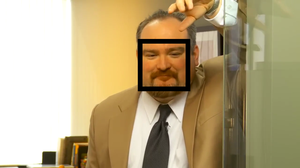

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.7682967532528161


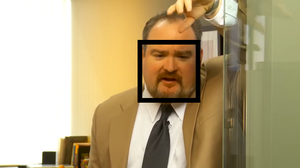

no need to further detect all frames

**** Processing Scene: 6 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.813450907413507


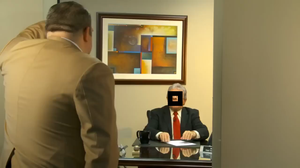

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8951043518289276


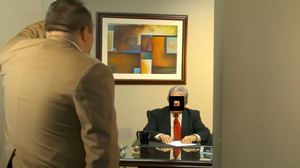

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9331213352601673


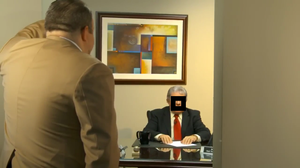

no need to further detect all frames

**** Processing Scene: 7 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.7519046680684057


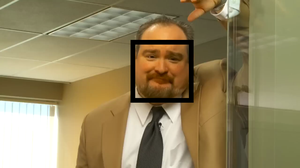

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.7070908480867875


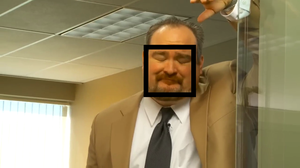

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.72790070386178


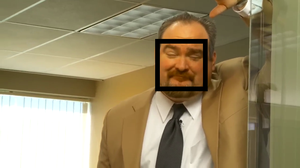

no need to further detect all frames

**** Processing Scene: 8 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.901159478842185


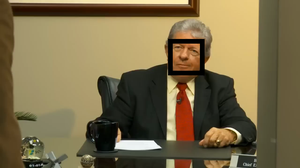

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8444180739943863


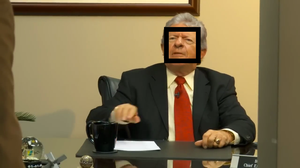

> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 9 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 10 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 11 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 12 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.6894872110637226


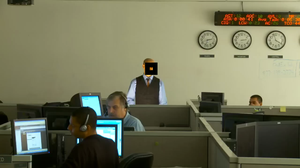

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.7642239364563957


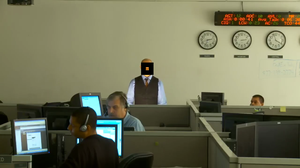

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.706650311911969


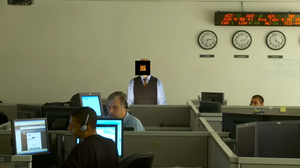

no need to further detect all frames

**** Processing Scene: 13 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 14 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 15 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8814020757990901


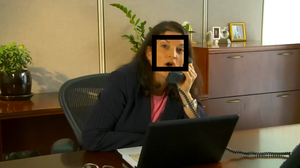

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8651954566034927


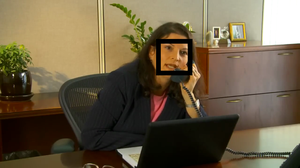

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8483698350653082


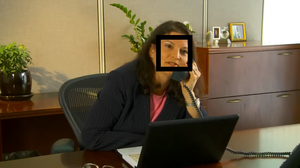

no need to further detect all frames

**** Processing Scene: 16 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 17 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9046574775222241


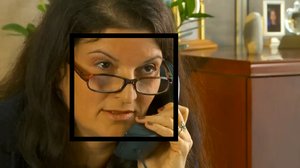

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8510928990627245


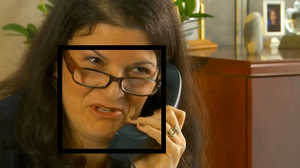

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8788302465342832


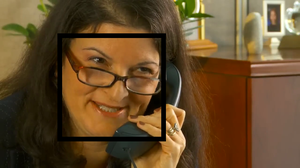

no need to further detect all frames

**** Processing Scene: 18 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> ❌ Checked last frame (no match target face, but found other faces, 0/2)
distances:
- 0.6523790901263357
- 0.7523847926280745


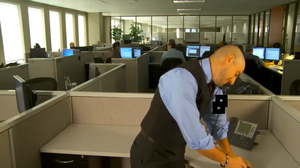

no need to further detect all frames

**** Processing Scene: 19 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 20 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 21 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8951676921987745


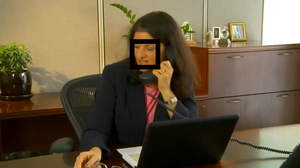

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8020213837117247


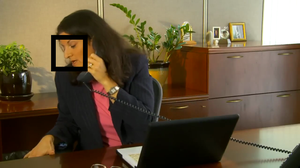

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8461314242983907


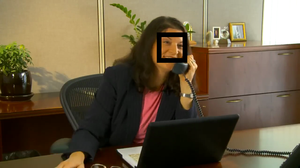

no need to further detect all frames

**** Processing Scene: 22 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 23 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.840388813865733


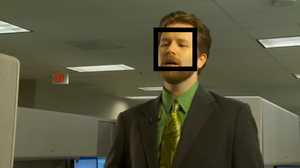

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8715554555916659


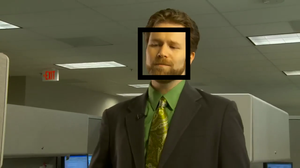

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8583219945856183


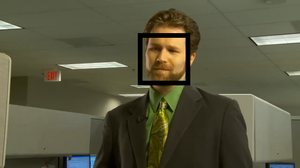

no need to further detect all frames

**** Processing Scene: 24 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8454435992259484


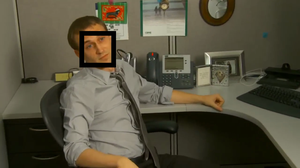

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8780644195018653


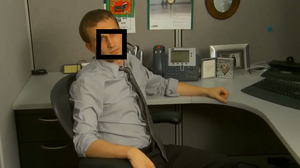

no need to further detect all frames

**** Processing Scene: 25 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8322203176091024


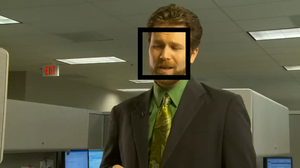

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8602366077255843


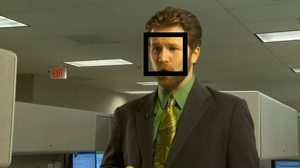

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8878408721491682


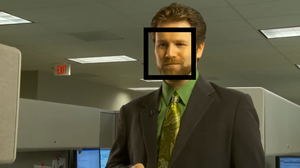

no need to further detect all frames

**** Processing Scene: 26 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.853516781491394


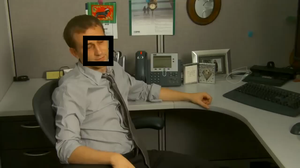

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8585359527441911


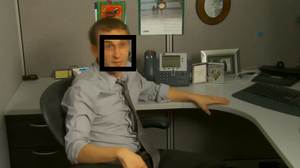

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8560875664149707


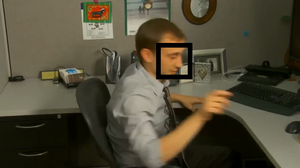

no need to further detect all frames

**** Processing Scene: 27 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8298482745199894


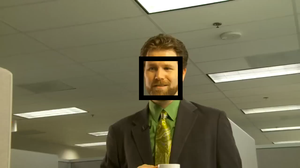

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8939542987557397


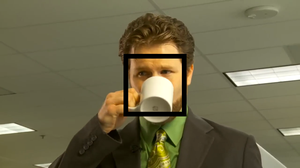

> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 28 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 29 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 30 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 31 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 32 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames

**** Processing Scene: 33 ****
> 🫥 No face in first frame
> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8329925123265046


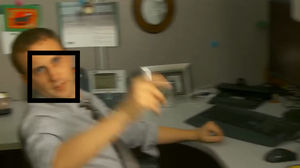

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9023914326041365


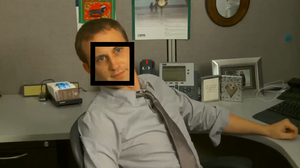

no need to further detect all frames

**** Processing Scene: 34 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.9086507529609957


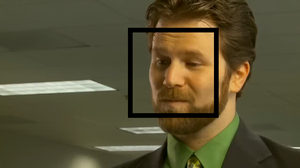

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.9038943895862788


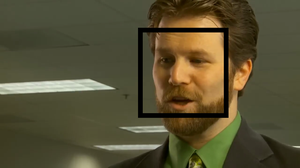

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9133941030162386


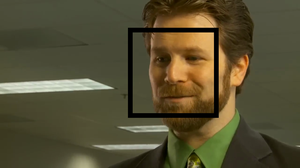

no need to further detect all frames

**** Processing Scene: 35 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8690433195016954


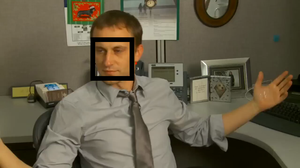

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8642492785373261


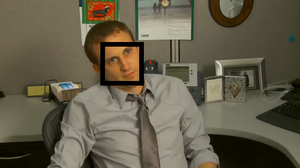

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.9037634119542356


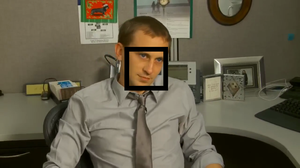

no need to further detect all frames

**** Processing Scene: 36 ****
> ❌ Checked first frame (no match target face, but found other faces, 0/1)
distances:
- 0.8600643186321043


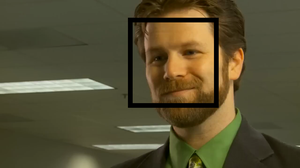

> ❌ Checked middle frame (no match target face, but found other faces, 0/1)
distances:
- 0.8842972357212945


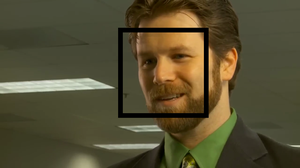

> ❌ Checked last frame (no match target face, but found other faces, 0/1)
distances:
- 0.8535799093250486


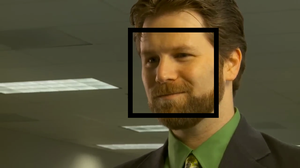

no need to further detect all frames

**** Processing Scene: 37 ****
> 🫥 No face in first frame
> 🫥 No face in middle frame
> 🫥 No face in last frame
no need to further detect all frames
finished processing all scenes.

-------- Saving Metadata --------
saved metadata to project/results/reference_face_another_video/metadata.json
Not found any target face at all throughout the entire video project/source/another_video.mp4


In [28]:
run_detect(
    reference_face_name = "reference_face.jpg",
    video_name = "another_video.mp4", 
    tolerance = 0.5,
    show_process = True
)

### **Scenario 3: Reference image has no human face**

##### **1. view.png + another_video.mp4**


-------- Encoding Target Face --------
no face detected


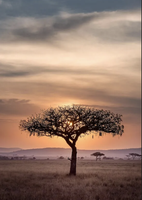

Exception: No face detected, ensure to have human face in your reference image ../source/view.png

In [30]:
run_detect(
    reference_face_name = "view.png",
    video_name = "another_video.mp4", 
    tolerance = 0.5,
    show_process = True
)

##### **2. dog.png + another_video.mp4**


-------- Encoding Target Face --------
no face detected


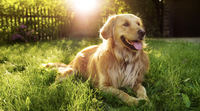

Exception: No face detected, ensure to have human face in your reference image ../source/dog.png

In [31]:
run_detect(
    reference_face_name = "dog.png",
    video_name = "another_video.mp4", 
    tolerance = 0.5,
    show_process = True
)

##### **3. monster.png + another_video.mp4**


-------- Encoding Target Face --------
no face detected


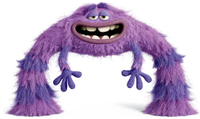

Exception: No face detected, ensure to have human face in your reference image ../source/monster.png

In [32]:
run_detect(
    reference_face_name = "monster.png",
    video_name = "another_video.mp4", 
    tolerance = 0.5,
    show_process = True
)